<a href="https://colab.research.google.com/github/ArturoMaiani/Master-Thesis---Pixies/blob/main/PPO_structure_1_comparison_algorithms.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# promemoria per usare conda environment con python

# per creare ambiente
# conda create -n pytorch python 3.9
# conda activate pytorch 
# conda install pytorch torchvision -c pytorch

# per usare ambiente
# conda activate pytorch
# python -m idlelib

In [ ]:
# ORDINE DEL GIORNO 30 SETTEMBRE
# INIZIARE A BUTTARE GIù LA STRUTTURA DEL PPT
# SIMULARE CON MODELLO ESATTO IL CASO FULL STATE


#link immagini negative
# https://www.imgonline.com.ua/eng/make-negative-result.php

## Imports

In [ ]:
!apt-get install ffmpeg freeglut3-dev xvfb  # For visualization
!pip install stable-baselines3[extra]

Reading package lists... Done
Building dependency tree       
Reading state information... Done
freeglut3-dev is already the newest version (2.8.1-3).
freeglut3-dev set to manually installed.
ffmpeg is already the newest version (7:3.4.11-0ubuntu0.1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  xvfb
0 upgraded, 1 newly installed, 0 to remove and 20 not upgraded.
Need to get 785 kB of archives.
After this operation, 2,271 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 xvfb amd64 2:1.19.6-1ubuntu4.11 [785 kB]
Fetched 785 kB in 1s (630 kB/s)
Selecting previously unselected package xvfb.
(Reading database ... 159447 files and directories currently installed.)
Preparing to unpack .../xvfb_2%3a1.19.6-1ubuntu4.11_amd64.deb ...
Unpacking xvfb (2:1.19.6-1ubuntu4.11) ...
Setting up xvfb (2:1.19.6

In [ ]:
import stable_baselines3
stable_baselines3.__version__

'1.6.1'

Stable-Baselines works on environments that follow the [gym interface](https://stable-baselines.readthedocs.io/en/master/guide/custom_env.html).
You can find a list of available environment [here](https://gym.openai.com/envs/#classic_control).

It is also recommended to check the [source code](https://github.com/openai/gym) to learn more about the observation and action space of each env, as gym does not have a proper documentation.
Not all algorithms can work with all action spaces, you can find more in this [recap table](https://stable-baselines.readthedocs.io/en/master/guide/algos.html)

In [ ]:

import gym
import numpy as np
from gym import Env
from gym.spaces import Discrete, Box
import random
import matplotlib.pyplot as plt
from matplotlib import colors
import time
import copy
import torch as th

The first thing you need to import is the RL model, check the documentation to know what you can use on which problem

In [ ]:
from stable_baselines3 import PPO

The next thing you need to import is the policy class that will be used to create the networks (for the policy/value functions).
This step is optional as you can directly use strings in the constructor: 

```PPO('MlpPolicy', env)``` instead of ```PPO(MlpPolicy, env)```

Note that some algorithms like `SAC` have their own `MlpPolicy`, that's why using string for the policy is the recommened option.

In [ ]:
from stable_baselines3.ppo import MlpPolicy

In [ ]:
from google.colab import drive
from google.colab import files
drive.mount('/content/drive')

Mounted at /content/drive


## environment

### setup

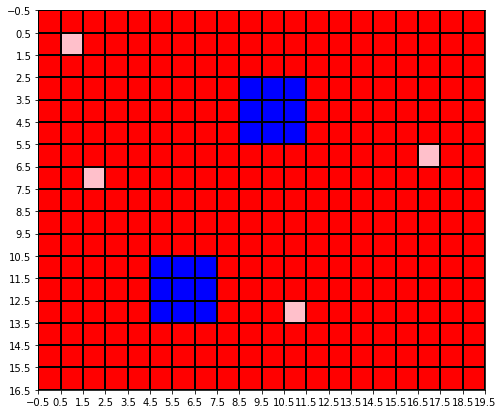

In [ ]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

def Convert(string):
    string=string.replace("[","")
    string=string.replace("]","")
    li = list(string.split(", "))
    li=[float(i) for i in li]
    return li


gain=1
penalty=0
size_x=17
size_y=20
mosse_max=500

size=8+3 #number of state variables

v_mid=0.5

omega_max=0.3
delta_t=(2*np.pi/(8*omega_max))


numero_mosse_massime=[0]
numero_partite_vinte=[0]

lista_aree=[]
sparse_reward=True


def init_reward_grid():
    grid=np.zeros((size_x,size_y))

    x1=random.randint(1,3)
    y1=random.randint(1,3)

    x2=random.randint(7,9)
    y2=random.randint(1,3)
    
    x3=random.randint(12,14)
    y3=random.randint(9,11)

    x4=random.randint(4,6)
    y4=random.randint(15,17)

    grid[x1,y1]=1
    grid[x2,y2]=1
    grid[x3,y3]=1
    grid[x4,y4]=1
    grid[3:6,9:12]=-2
    grid[11:14,5:8]=-2

    return grid,[[x1/(size_x-1),y1/(size_y-1)],[x2/(size_x-1),y2/(size_y-1)],[x3/(size_x-1),y3/(size_y-1)],[x4/(size_x-1),y4/(size_y-1)]]

def ricompensa(pos_x,pos_y,square):
    reward=0
    for i  in range(3):
      for j  in range(3):
        if square[i,j]>0:
          reward+=square[i,j]
          target=env.lista_target.index([(pos_x-1+i)/(size_x-1),(pos_y-1+j)/(size_y-1)])
          env.state[3+target*2:3+target*2+2]=-1
          break
    return reward

def resetta(x,y):
    for i in range(-1,2):
        for j in range(-1,2):
            if x+i<17 and x+i>=0 and y+j<20 and y+j>=0:
                if env.reward_grid[x+i,y+j]>0:
                    env.reward_grid[x+i,y+j]=0
                    
    

def get_starting_location():
  return 11, 18, 0.75



#Show an example of the map
cmap = colors.ListedColormap(['blue', 'red','green','pink'])
bounds = [-2,-0.1,0.3,0.7,1]
norm = colors.BoundaryNorm(bounds, cmap.N)
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(init_reward_grid()[0], cmap=cmap,norm=norm)
ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
ax.set_xticks(np.arange(-0.5, 20, 1));   
ax.set_yticks(np.arange(-0.5, 17, 1)); 

In [ ]:



action_list=[
             [v_mid,-omega_max],
             [v_mid,omega_max],
             [v_mid,0],
             ]



class PiazzaDelPopolo(Env):
    

    def __init__(self):
        
        pos_x_init=0
        pos_y_init=0
        theta_in=0

        self.reward_grid=[]
        self.pixel_grid=[]
        
        self.state=np.zeros(size)
       
   
        self.state[0:3] = [pos_x_init/size_x,pos_y_init/size_y,theta_in]

        self.action_space = self.action_space = Discrete(len(action_list))
        highh=np.ones(size)
        loww= np.zeros(size)
        
            
        self.observation_space = Box(low=loww,high=highh)
        # x y theta battery %completata - pixels
        
        # l'area coperta all'inizio è zero quindi manca ancora 1
        self.stato_memoria=[]
        
        
    


    def step(self, action):
        done= False
        self.mossa+=1
        if self.mossa >mosse_max:
            reward=0
            lista_aree.append([self.state[3],self.state[5],self.state[7],self.state[9]].count(-1))
            numero_mosse_massime[0]+=1
            done=True
            info = {}
            reward=0
            # Return step information
            return self.state, reward, done, info
        #if True==False:
        if random.randint(0,15000)==5:
            print('----------')
            print('partite vinte:',numero_partite_vinte[0])
            print('partite con troppe mosse:',numero_mosse_massime[0])
            print('area max ultime 100 partite:',(4-np.min(lista_aree[len(lista_aree)-100:]))/4)
            print('----------')
            plt.figure()
            plt.hist(lista_aree[len(lista_aree)-100:])
            plt.show()
        
           #prima -0.5 era troppo
        self.stato_memoria=[self.state[0],self.state[1]]
 
        if self.state[0]*size_x<=size_x-1 and self.state[0]*size_x>=1 and self.state[1]*size_y<=size_y-1 and self.state[1]*size_y>=1:       
            
            angolone=self.state[2]*np.pi*2
            #euler
            #self.state[0]+=delta_t*np.cos(angolone)*action_list[action][0]/(size_x-1)
            #self.state[1]+=delta_t*np.sin(angolone)*action_list[action][0]/(size_y-1)
            #self.state[2]+=delta_t*action_list[action][1]/(2*np.pi)
            #runge kutta
            #self.state[0]+=delta_t*np.cos(angolone+action_list[action][1]*delta_t/2)*action_list[action][0]/(size_x-1)
            #self.state[1]+=delta_t*np.sin(angolone+action_list[action][1]*delta_t/2)*action_list[action][0]/(size_y-1)
            #self.state[2]+=delta_t*action_list[action][1]/(2*np.pi)
            if action==2:
                self.state[0]+=delta_t*np.cos(angolone)*action_list[action][0]/(size_x-1)
                self.state[1]+=delta_t*np.sin(angolone)*action_list[action][0]/(size_y-1)
            else:
                
                self.state[2]+=delta_t*action_list[action][1]/(2*np.pi)
                
                self.state[0]+=(action_list[action][0]/action_list[action][1])*(np.sin(self.state[2]*2*np.pi)-np.sin(angolone))/(size_x-1)
                self.state[1]-=(action_list[action][0]/action_list[action][1])*(np.cos(self.state[2]*2*np.pi)-np.cos(angolone))/(size_y-1)
            

            
        if self.state[2]>1:
            self.state[2]-=1
        if self.state[2]<0:
            self.state[2]+=1
            

        if self.state[0]*size_x>size_x+0.1-1:
            
            self.state[0:2]=self.stato_memoria
            info = {}
            reward=0
            # Return step information
            return self.state, reward, done, info

        if self.state[0]*size_x<0.9:
            
            self.state[0:2]=self.stato_memoria
            info = {}
            reward=0
            # Return step information
            return self.state, reward, done, info

        if self.state[1]*size_y>size_y+0.1-1:
            
            self.state[0:2]=self.stato_memoria
            info = {}
            reward=0
            # Return step information
            return self.state, reward, done, info
            
        if self.state[1]*size_y<0.9:
            
            self.state[0:2]=self.stato_memoria
            info = {}
            reward=0
            # Return step information
            return self.state, reward, done, info

        
        if self.reward_grid[int(np.round((size_x-1)*self.state[0])),int(np.round((size_y-1)*self.state[1]))]<-1.6:
            
            self.state[0:2]=self.stato_memoria
            info = {}
            reward=0
            # Return step information
            return self.state, reward, done, info

        # battery decrease
        
        
        

        
        pos_x=int(np.round(self.state[0]*(size_x-1)))
        pos_y=int(np.round(self.state[1]*(size_y-1)))

        
        

        # prende il valore della casella : 
        
        reward=ricompensa(pos_x,pos_y,self.reward_grid[pos_x-1:pos_x+2,pos_y-1:pos_y+2])
        

#-------Garbage collected----------------------------------------        
        if reward>0:

            resetta(pos_x,pos_y)
    
        
        # AGGIORNO LO STATO!!!!!! MI ERO DIMENTICATO
        #if len(vectorize_map(self.pixel_grid))>size:
        #  plottagrid(self.pixel_grid.reshape(size_x,size_y))
          

         #define a function that determines if the specified location is a terminal state
        if self.state[3]+self.state[5]+self.state[7]+self.state[9]==-4:# il 3 è l'AREA COPERTA!!!!
            reward=1
            lista_aree.append([self.state[3],self.state[5],self.state[7],self.state[9]].count(-1))
            numero_partite_vinte[0]+=1
            done=True
        elif self.mossa >mosse_max:
            reward=-1
            lista_aree.append([self.state[3],self.state[5],self.state[7],self.state[9]].count(-1))
            numero_mosse_massime[0]+=1
            done=True
        else:
            done= False
        
        #reward=reward*1.5
        info = {}

        reward=reward*0.5*(1+[self.state[3],self.state[5],self.state[7],self.state[9]].count(-1)/4)**2
        # Return step information
        return self.state, reward, done, info

    def render(self):
        pass
    
    
    
    def reset(self):
        self.state=np.zeros(size)
        
       
        #print(a)
        
        self.GRIGLIA_INIZIALE=init_reward_grid()

        self.reward_grid=self.GRIGLIA_INIZIALE[0]
        
        
        self.lista_target=self.GRIGLIA_INIZIALE[1]
        
        pos_x_reset,pos_y_reset,theta_in=get_starting_location() #this is integer
        #theta_in=random.uniform(0,1)


        
        self.state[0:3] = [pos_x_reset/(size_x-1),pos_y_reset/(size_y-1),theta_in]
    
        self.state[3:5]=self.lista_target[0]
    
        self.state[5:7]=self.lista_target[1]
        
        self.state[7:9]=self.lista_target[2]
        
        self.state[9:]=self.lista_target[3]
   
        
     
        self.mossa=0
        
        
        return self.state

# FONDAMENTALE PER CREARE L ENVIRONMENT
env=PiazzaDelPopolo()

def plottagrid(matrice):
    
    px=env.state[0]*(size_x-1)
    py=env.state[1]*(size_y-1)
    cmap = colors.ListedColormap(['blue', 'red','green','pink'])
    bounds = [-2,-0.1,0.1,0.3,0.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    theta=env.state[2]*2*np.pi
    lungo=1

    fig, ax = plt.subplots(figsize=(8, 8))
   
    ax.imshow(matrice, cmap=cmap,norm=norm)
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-0.5, 20, 1));
        
    ax.set_yticks(np.arange(-0.5, 17, 1)); 
 
    plt.plot([py,py+lungo*np.sin(theta)],[px,px+lungo*np.cos(theta)],linewidth=5,color='white')
    plt.plot(py, px, marker="o", markersize=20, markeredgecolor="white", markerfacecolor="white")


/usr/local/lib/python3.7/dist-packages/gym/spaces/box.py:74: UserWarning: WARN: Box bound precision lowered by casting to float32
  "Box bound precision lowered by casting to {}".format(self.dtype)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'\nfrom google.colab import files\nplt.savefig("sample.jpg", dpi=150)\nfiles.download("sample.jpg")'

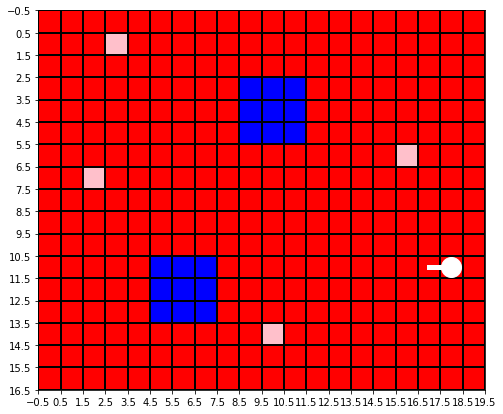

In [ ]:
episodes = 1
for episode in range(1, episodes+1):
    env.reset()
    #print(np.multiply(env.reset()[0:2],size))
    #print(env.reward_grid)
    #print('batteria',env.state[3])
    done = False
    score = 0 
    plottagrid(env.reward_grid)
    #from google.colab import files
    #plt.savefig("sample.jpg", dpi=150)
    #files.download("sample.jpg")  
    #while not done:

    for i in range(1):
        if done==True:
          print('cazzo')
          print(score, env.mossa,[env.state[3],env.state[5],env.state[7],env.state[9]].count(-1))
          print([env.state[3],env.state[5],env.state[7],env.state[9]])
          break
        #env.render()
        #temp=[env.state[0],env.state[1]]
        action = env.action_space.sample()
        #action = 0
        n_state, reward, done, info = env.step(action)
        #print(np.round(env.reward_grid,2))
        score+=reward
        #print(np.round(env.pixel_grid,1))
        lungo=1
        plt.plot([env.state[1]*(size_y-1),env.state[1]*(size_y-1)+lungo*np.sin(env.state[2]*2*np.pi)],[env.state[0]*(size_x-1),env.state[0]*(size_x-1)+lungo*np.cos(env.state[2]*2*np.pi)],linewidth=5,color='white')
        plt.plot(env.state[1]*(size_y-1), env.state[0]*(size_x-1), marker="o", markersize=20, markeredgecolor="white", markerfacecolor="white")
        
        #drawnow()

        print('mossa numero',env.mossa)
        print('posizione',[env.state[0]*size_x,env.state[1]*size_y,env.state[2]*np.pi*2],'reward',reward,'azione',action_list[action])
        print(env.state[3:])
        
        print('------------------------------------------------------------------')
   

'''
from google.colab import files
plt.savefig("sample.jpg", dpi=150)
files.download("sample.jpg")'''
       

In [ ]:
a=[0,1,1,1,1,1,0,1]
a.count([1,1,1,1,1])

0

### modello

In [ ]:
class Schedule(object):
    def value(self, step):
        """
        Value of the schedule for a given timestep

        :param step: (int) the timestep
        :return: (float) the output value for the given timestep
        """
        raise NotImplementedError

def get_linear_fn(start: float, end: float, end_fraction: float) -> Schedule:
    """
    Create a function that interpolates linearly between start and end
    between ``progress_remaining`` = 1 and ``progress_remaining`` = ``end_fraction``.
    This is used in DQN for linearly annealing the exploration fraction
    (epsilon for the epsilon-greedy strategy).

    :params start: value to start with if ``progress_remaining`` = 1
    :params end: value to end with if ``progress_remaining`` = 0
    :params end_fraction: fraction of ``progress_remaining``
        where end is reached e.g 0.1 then end is reached after 10%
        of the complete training process.
    :return: Linear schedule function.
    """

    def func(progress_remaining: float) -> float:
        if (1 - progress_remaining) > end_fraction:
            return end
        if progress_remaining > end_fraction:
            return end
        else:
            return start + (1 - progress_remaining) * (end - start) / end_fraction

    return func



def learning_rate_custom_PPO() -> Schedule:
    """
    Create a function that interpolates linearly between start and end
    between ``progress_remaining`` = 1 and ``progress_remaining`` = ``end_fraction``.
    This is used in DQN for linearly annealing the exploration fraction
    (epsilon for the epsilon-greedy strategy).

    :params start: value to start with if ``progress_remaining`` = 1
    :params end: value to end with if ``progress_remaining`` = 0
    :params end_fraction: fraction of ``progress_remaining``
        where end is reached e.g 0.1 then end is reached after 10%
        of the complete training process.
    :return: Linear schedule function.


    def func(progress_remaining: float) -> float:
        progress_remaining=1-progress_remaining
        if progress_remaining < 0.1:
            return 0.00013
        if progress_remaining < 0.2:
            return 0.00011
        if progress_remaining < 0.3:
            return 0.0001
        if progress_remaining < 0.4:
            return 0.00009
        if progress_remaining < 0.5:
            return 0.00008
        if progress_remaining < 0.6:
            return 0.00006
        if progress_remaining < 0.7:
            return 0.00005
        if progress_remaining < 0.8:
            return 0.00003
        if progress_remaining < 0.9:
            return 0.00001
        else:
            return 0.00001"""
    def func(progress_remaining: float) -> float:
        progress_remaining=1-progress_remaining
        if progress_remaining < 0.2:
            return 0.0003
        if progress_remaining < 0.4:
            return 0.0002
        if progress_remaining < 0.5:
            return 0.00015
        if progress_remaining < 0.6:
            return 0.0001
        if progress_remaining < 0.8:
            return 0.0008
        if progress_remaining < 0.9:
            return 0.00003
        else:
            return 0.00008


    return func

def learning_rate_custom_DQN() -> Schedule:
    """
    Create a function that interpolates linearly between start and end
    between ``progress_remaining`` = 1 and ``progress_remaining`` = ``end_fraction``.
    This is used in DQN for linearly annealing the exploration fraction
    (epsilon for the epsilon-greedy strategy).

    :params start: value to start with if ``progress_remaining`` = 1
    :params end: value to end with if ``progress_remaining`` = 0
    :params end_fraction: fraction of ``progress_remaining``
        where end is reached e.g 0.1 then end is reached after 10%
        of the complete training process.
    :return: Linear schedule function.
    """

    def func(progress_remaining: float) -> float:
        progress_remaining=1-progress_remaining
        if progress_remaining < 0.1:
            return 0.00005
        if progress_remaining < 0.2:
            return 0.00005
        if progress_remaining < 0.3:
            return 0.00004
        if progress_remaining < 0.4:
            return 0.00004
        if progress_remaining < 0.5:
            return 0.00004
        if progress_remaining < 0.6:
            return 0.00003
        if progress_remaining < 0.7:
            return 0.00003
        if progress_remaining < 0.8:
            return 0.00002
        if progress_remaining < 0.9:
            return 0.00001
        else:
            return 0.00001

    return func
def learning_rate_custom_A2C() -> Schedule:
    """
    Create a function that interpolates linearly between start and end
    between ``progress_remaining`` = 1 and ``progress_remaining`` = ``end_fraction``.
    This is used in DQN for linearly annealing the exploration fraction
    (epsilon for the epsilon-greedy strategy).

    :params start: value to start with if ``progress_remaining`` = 1
    :params end: value to end with if ``progress_remaining`` = 0
    :params end_fraction: fraction of ``progress_remaining``
        where end is reached e.g 0.1 then end is reached after 10%
        of the complete training process.
    :return: Linear schedule function.
    """

    def func(progress_remaining: float) -> float:
        progress_remaining=1-progress_remaining
        if progress_remaining < 0.1:
            return 0.0007
        if progress_remaining < 0.2:
            return 0.0006
        if progress_remaining < 0.3:
            return 0.0005
        if progress_remaining < 0.4:
            return 0.0004
        if progress_remaining < 0.5:
            return 0.0003
        if progress_remaining < 0.6:
            return 0.0003
        if progress_remaining < 0.7:
            return 0.0002
        if progress_remaining < 0.8:
            return 0.0002
        if progress_remaining < 0.9:
            return 0.0001
        else:
            return 0.0001

    return func

In [ ]:
#0.0000065
lrr=0.000019#0.00005,grigia,#0.00004,#0.000035
# 300 k at 0.0002
# 500 k at 0.0001
# 300 k at 0.00007
# 300 k at 0.00005
# 300 k at 0.00002
# 1 M at 0.00001
# 1 M at 0.000009
'''
policy_kwargs = dict(activation_fn=th.nn.Tanh,
                     net_arch=[dict(pi=[400, 400,400], vf=[400, 400,400])])'''

policy_kwargs = dict(activation_fn=th.nn.Tanh,net_arch=[dict(pi=[200, 200,200], vf=[200, 200,200])])

policy_kwargs_DQN = dict(activation_fn=th.nn.Tanh,
                     net_arch=[200, 200,200])
Model_type='PPO' #DQN,PPO


if Model_type=='DQN':
    model = stable_baselines3.dqn.DQN("MlpPolicy", env, 
                                      learning_rate=learning_rate_custom_DQN(),policy_kwargs=policy_kwargs_DQN,
                                      batch_size=1600, verbose=0,exploration_initial_eps=1,
                                      exploration_fraction=0.1,train_freq=(1, "episode"),max_grad_norm =2,gradient_steps=2,
                                      tensorboard_log="./pixies_tensorboard/")
if Model_type=='PPO':
    model = PPO(MlpPolicy, env,policy_kwargs=policy_kwargs, ent_coef=0.0,gamma=0.995,
                                      learning_rate=learning_rate_custom_PPO(),n_epochs=4,
                                      batch_size=400,verbose=0,n_steps=2000,
                                      tensorboard_log="./pixies_tensorboard/")

if Model_type=='A2C':
    model = stable_baselines3.a2c.A2C("MlpPolicy",env, learning_rate=learning_rate_custom_A2C(),
 n_steps=500, gamma=0.99, gae_lambda=1.0, ent_coef=0.0, vf_coef=0.5,use_rms_prop=False,
  max_grad_norm=0.5, rms_prop_eps=1e-05,policy_kwargs=policy_kwargs,tensorboard_log="./pixies_tensorboard/")


'''
stable_baselines3.a2c.A2C(policy, env, learning_rate=0.0007,
 n_steps=5, gamma=0.99, gae_lambda=1.0, ent_coef=0.0, vf_coef=0.5,
  max_grad_norm=0.5, rms_prop_eps=1e-05, use_rms_prop=True, use_sde=False,
   sde_sample_freq=-1, normalize_advantage=False, tensorboard_log=None, 
   create_eval_env=False, policy_kwargs=None, verbose=0, seed=None, 
   device='auto', _init_setup_model=True)



stable_baselines3.dqn.DQN(policy, env, learning_rate=0.0001, 
                          buffer_size=1000000, learning_starts=50000, batch_size=32, 
                          tau=1.0, gamma=0.99, train_freq=4, gradient_steps=1, 
                          replay_buffer_class=None, replay_buffer_kwargs=None, 
                          optimize_memory_usage=False, target_update_interval=10000, 
                          exploration_fraction=0.1, exploration_initial_eps=0.9, 
                          exploration_final_eps=0.05, max_grad_norm=10, tensorboard_log=None, 
                          create_eval_env=False, policy_kwargs=None, verbose=0, seed=None, 
                          device='auto', _init_setup_model=True)'''

"\nstable_baselines3.a2c.A2C(policy, env, learning_rate=0.0007,\n n_steps=5, gamma=0.99, gae_lambda=1.0, ent_coef=0.0, vf_coef=0.5,\n  max_grad_norm=0.5, rms_prop_eps=1e-05, use_rms_prop=True, use_sde=False,\n   sde_sample_freq=-1, normalize_advantage=False, tensorboard_log=None, \n   create_eval_env=False, policy_kwargs=None, verbose=0, seed=None, \n   device='auto', _init_setup_model=True)\n\n\n\nstable_baselines3.dqn.DQN(policy, env, learning_rate=0.0001, \n                          buffer_size=1000000, learning_starts=50000, batch_size=32, \n                          tau=1.0, gamma=0.99, train_freq=4, gradient_steps=1, \n                          replay_buffer_class=None, replay_buffer_kwargs=None, \n                          optimize_memory_usage=False, target_update_interval=10000, \n                          exploration_fraction=0.1, exploration_initial_eps=0.9, \n                          exploration_final_eps=0.05, max_grad_norm=10, tensorboard_log=None, \n                    

In [ ]:
model = PPO(MlpPolicy, env,policy_kwargs=policy_kwargs, ent_coef=0.01,gamma=0.995,
                                      learning_rate=0.00002,n_epochs=4,
                                      batch_size=400,verbose=0,n_steps=2000,
                                      tensorboard_log="./pixies_tensorboard/")
model.set_parameters('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/MODELLO_STRUCTURE_1_BIG_MAP_200_200_200/MODELLO_STRUCTURE_1_BIG_MAP_200_200_200.zip')
    

In fact, Stable-Baselines3 already provides you with that helper:

In [ ]:
from stable_baselines3.common.evaluation import evaluate_policy

Let's evaluate the un-trained agent, this should be a random agent.

## Train the agent and evaluate it

In [ ]:
# test with 100,100,100 MLP 
# test with 200,100,100
print(144*100+100*100+100*100+100*3,144*200+100*100+100*100+100*3)

34700 49100


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./pixies_tensorboard/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# ho pensato di ridurre omega max per far fare meno curve
# ho pensato anche di allungare la lista di azioni dopo cui far morire
# ho pensato di aumentare la rete
# ho pensato di usare l'entropia

# Train the agent for 10000 steps


#PROVA AD AGGIUNGERE UNA PICCOLA PENALTY SULLE BARRIERE

model.learn(total_timesteps=1000000)
#model.save("PPO_checkpoint_")
#!cp PPO_checkpoint_.zip /content/drive/MyDrive/Colab_Notebooks/scripts_tesi

KeyboardInterrupt: ignored

In [ ]:
model.save("weee")

In [ ]:
# quello di prima è il nostop venuto abbastanza bene
#import os.path
#os.mkdir('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/MODELLO_STRUCTURE_2_SMALL_MAP')
model.save("MODELLO_STRUCTURE_1_BIG_MAP_200_200_200")
!cp MODELLO_STRUCTURE_1_BIG_MAP_200_200_200.zip /content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/MODELLO_STRUCTURE_1_BIG_MAP_200_200_200

### Video making

In [ ]:
import shutil

shutil.rmtree('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2')

In [ ]:
import os.path
os.mkdir('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2')

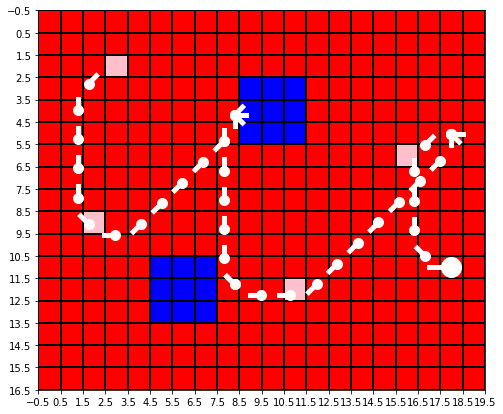

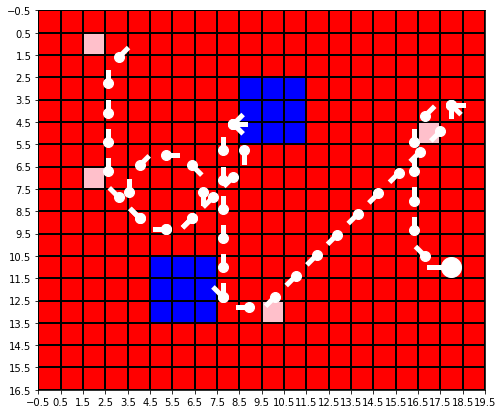

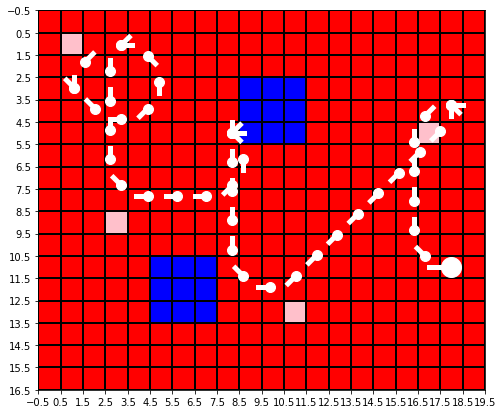

In [ ]:
episodes = 3
from google.colab import files
for episode in range(1, episodes+1):
    done = False
    obs = env.reset()
    score = 0 
    plottagrid(env.reward_grid)
    for i in range(100):
        if done==True:
          break
 
        action, _states = model.predict(obs)

        n_state, reward, done, info = env.step(action)
        lungo=0.5
        plt.plot([env.state[1]*(size_y-1),env.state[1]*(size_y-1)+lungo*np.sin(env.state[2]*2*np.pi)],[env.state[0]*(size_x-1),env.state[0]*(size_x-1)+lungo*np.cos(env.state[2]*2*np.pi)],linewidth=5,color='white')
        plt.plot(env.state[1]*(size_y-1), env.state[0]*(size_x-1), marker="o", markersize=10, markeredgecolor="white", markerfacecolor="white")
        #plt.savefig("/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2/"+"sample"+str(i)+".jpg", dpi=150)
        

       

In [ ]:
import cv2
import numpy as np
import glob

img_array = []
for filename in glob.glob('/content/drive/MyDrive/Colab_Notebooks/Colab-Notebooks/foto_video_ppo_structure_2/*.jpg'):
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)


out = cv2.VideoWriter('project.avi',cv2.VideoWriter_fourcc(*'DIVX'), 3, size)
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()

In [ ]:
from google.colab import files
!ffmpeg -i project.avi output.mp4
files.download('output.mp4') 
# .avi to mov
#https://www.movavi.com/support/how-to/how-to-convert-avi-to-mov.html

ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-li

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!ffmpeg -i project.avi output.mp4

from IPython.display import HTML
from base64 import b64encode
mp4 = open('output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-li

### Other stuff

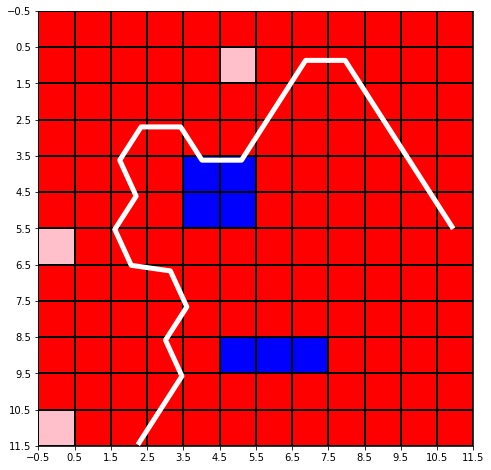

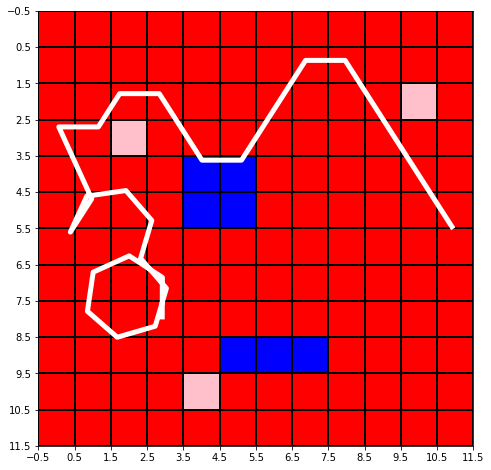

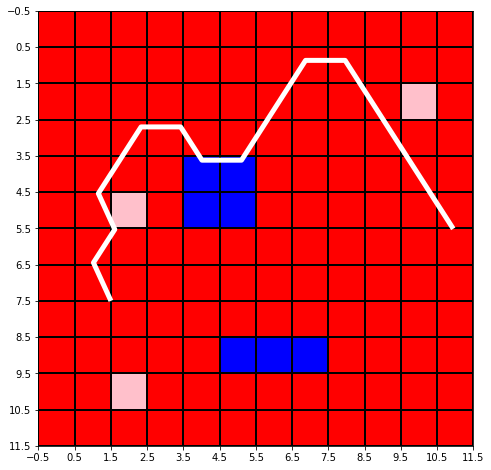

In [ ]:
episodes = 30




for episode in range(1, episodes+1):
    statess=np.zeros((2,400))
    obs = env.reset()
    mappaa=copy.deepcopy(env.reward_grid)
    statess[:,0]=[obs[0],obs[1]]

    done = False
    k=0
    for i in range(100):
        if done==True:
            break
        #action=int(lista_azioni[indice,i])
        action, _states = model.predict(obs,deterministic=True)
        statess[:,i]=[env.state[0],env.state[1]]
        obs, reward, done, info = env.step(action)
        k=i
    if env.state[3]>0.9:
        cmap = colors.ListedColormap(['blue', 'red','green','pink'])
        bounds = [-2,-0.1,0.1,0.3,0.5]
        norm = colors.BoundaryNorm(bounds, cmap.N)

        fig, ax = plt.subplots(figsize=(8, 8))

        ax.imshow(mappaa, cmap=cmap,norm=norm)
        ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
        ax.set_xticks(np.arange(-0.5, 20, 1));
          
        ax.set_yticks(np.arange(-0.5, 17, 1)); 
        plt.plot(statess[1,1:k]*size_y,statess[0,1:k]*size_x,linewidth=5,color='white')
        #plt.plot(moving_average(statess[1,1:k]*size_y,3),moving_average(statess[0,1:k]*size_x,3),linewidth=5,color='white')

------------


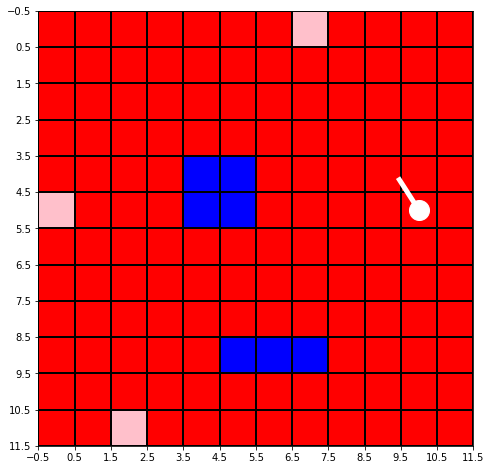

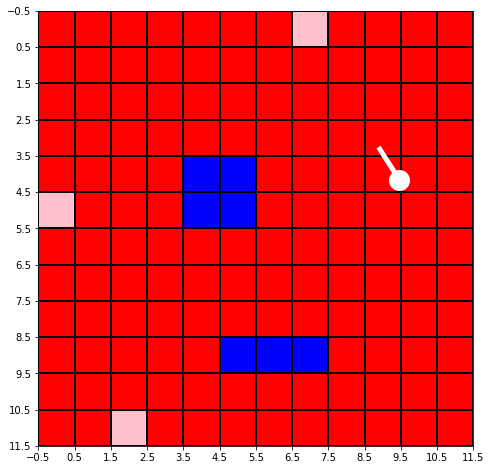

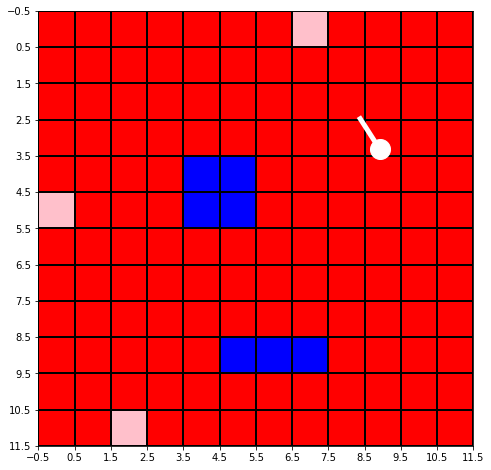

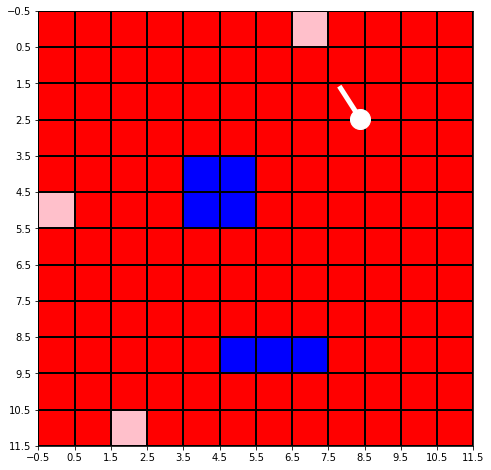

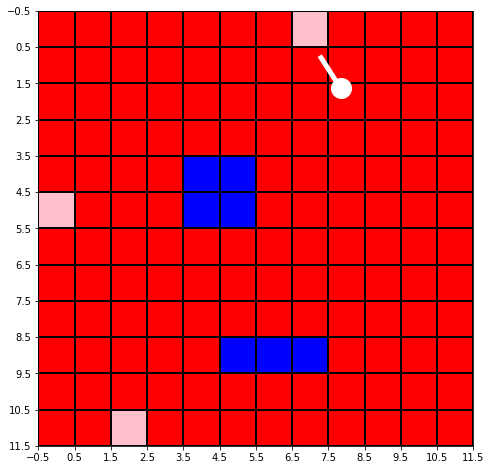

...

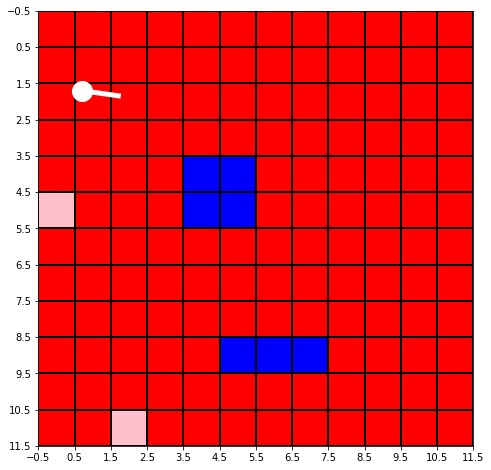

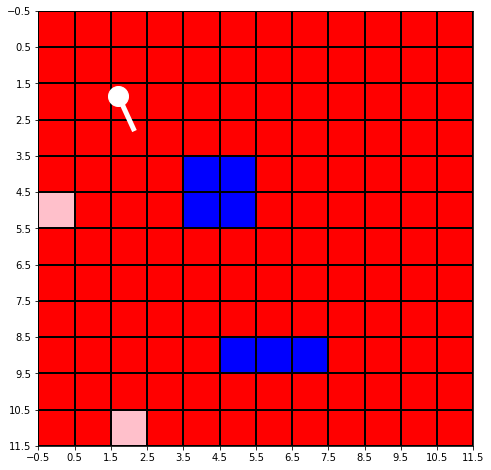

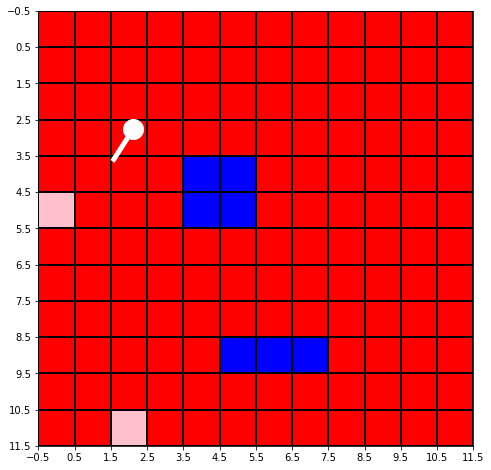

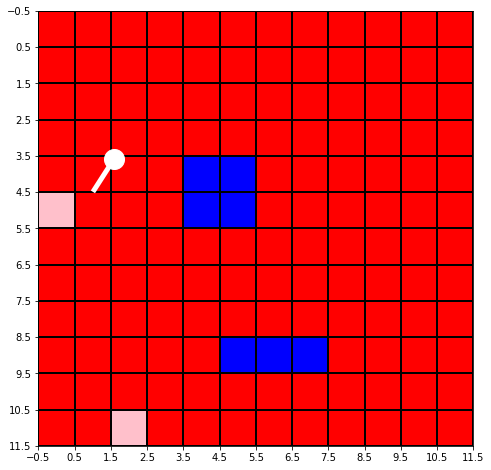

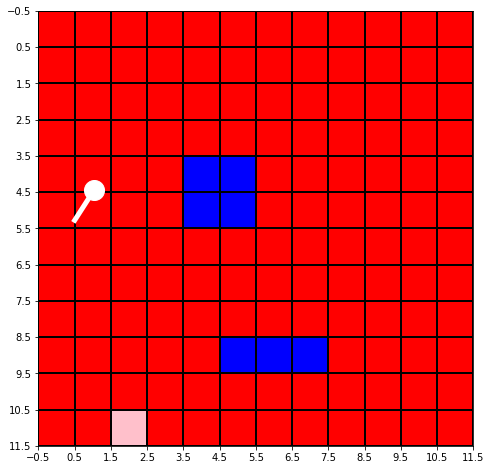

In [ ]:
episodes = 1
for episode in range(1, episodes+1):
    obs = env.reset()
    print('------------')
    done = False

    for i in range(20):
        if done==True:
            break
        action, _states = model.predict(obs)
        obs, reward, dones, info = env.step(action)
        plottagrid(env.reward_grid.reshape(size_x,size_y))

In [ ]:
model.save("PPO_square_checkpoint")
!cp PPO_square_checkpoint.zip /content/drive/MyDrive/Colab_Notebooks/scripts_tesi

In [ ]:
import os
import numpy as np
import pandas as pd

from collections import defaultdict
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator


def tabulate_events(dpath):
    summary_iterators = [EventAccumulator(os.path.join(dpath, dname)).Reload() for dname in os.listdir(dpath)]

    tags = summary_iterators[0].Tags()['scalars']

    for it in summary_iterators:
        assert it.Tags()['scalars'] == tags

    out = defaultdict(list)
    steps = []

    for tag in tags:
        steps = [e.step for e in summary_iterators[0].Scalars(tag)]

        for events in zip(*[acc.Scalars(tag) for acc in summary_iterators]):
            assert len(set(e.step for e in events)) == 1

            out[tag].append([e.value for e in events])

    return out, steps


def to_csv(dpath):
    dirs = os.listdir(dpath)

    d, steps = tabulate_events(dpath)
    tags, values = zip(*d.items())
    np_values = np.array(values)

    for index, tag in enumerate(tags):
        df = pd.DataFrame(np_values[index], index=steps, columns=dirs)
        df.to_csv(get_file_path(dpath, tag))


def get_file_path(dpath, tag):
    file_name = tag.replace("/", "_") + '.csv'
    folder_path = os.path.join(dpath, 'csv')
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    return os.path.join(folder_path, file_name)


if __name__ == '__main__':
    path = "path_to_your_summaries"
    to_csv(path)

In [ ]:
parametri=model.get_parameters()


In [ ]:
parametri

In [ ]:
parametri['policy']['mlp_extractor.policy_net.0.weight'].size()

torch.Size([150, 155])

In [ ]:
parametri['policy']['mlp_extractor.policy_net.0.bias'].size()

torch.Size([150])

In [ ]:
parametri['policy']['mlp_extractor.policy_net.2.weight'].size()

torch.Size([150, 150])

In [ ]:
parametri['policy']['mlp_extractor.policy_net.2.bias'].size()

torch.Size([150])

In [ ]:

parametri['policy']['action_net.weight'].size()

torch.Size([5, 150])

In [ ]:
parametri['policy']['action_net.bias'].size()

torch.Size([5])

------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:242: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


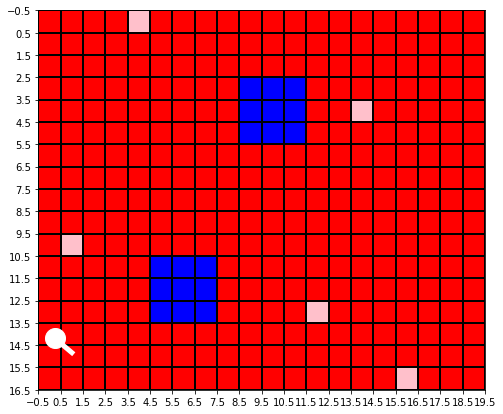

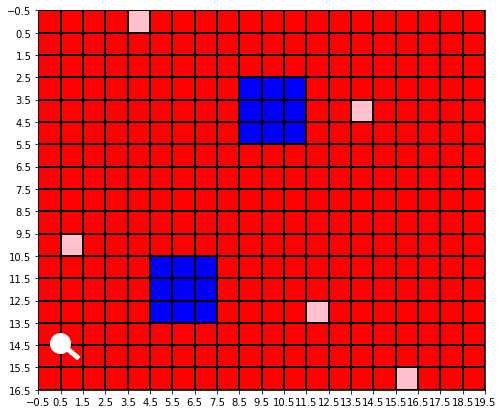

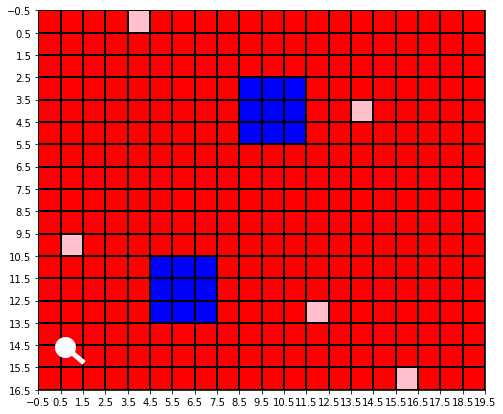

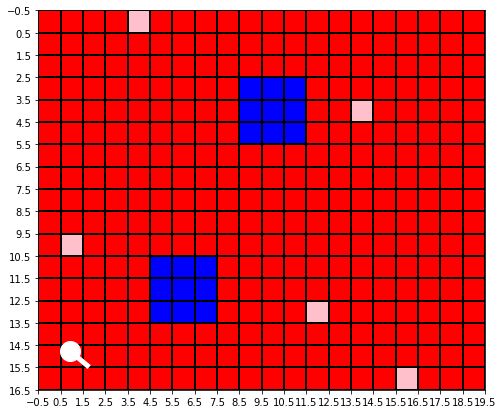

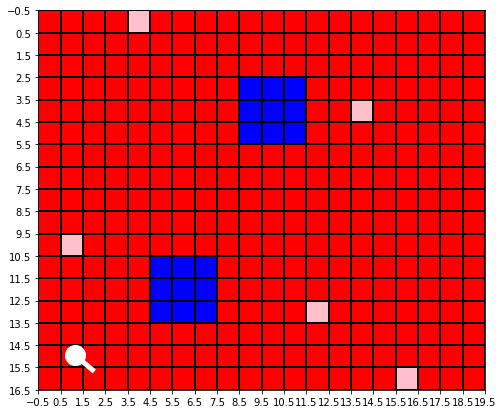

...

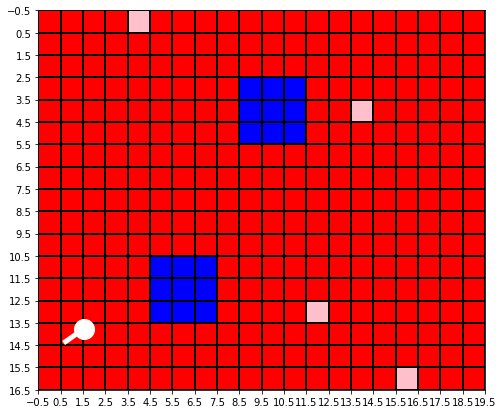

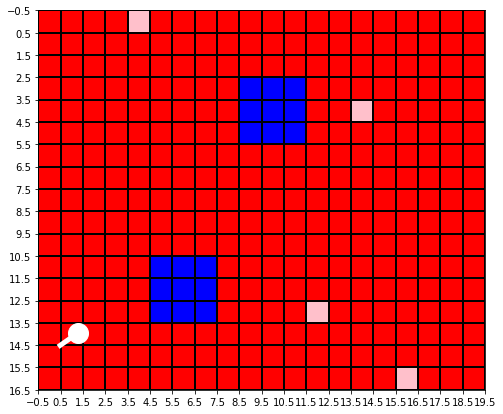

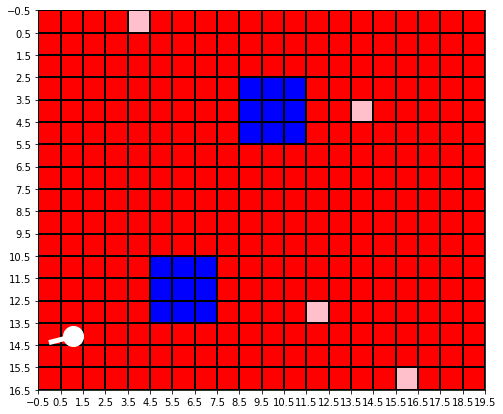

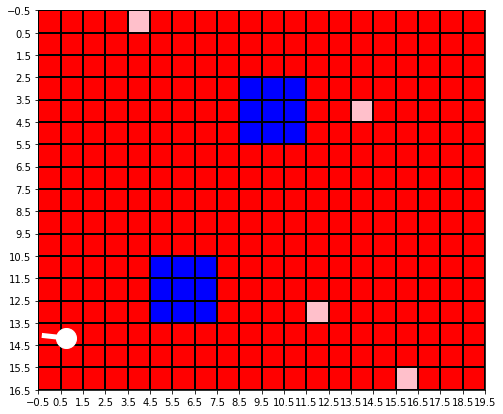

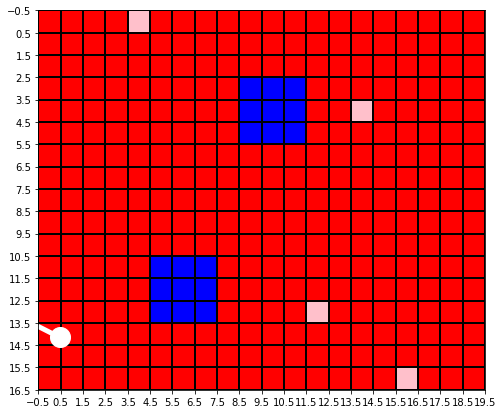

In [ ]:


episodes = 1
for episode in range(1, episodes+1):
    obs = env.reset()
    print('------------')
    done = False
    score = 0 
    k1=0
    k2=0
    for i in range(150):
        if done==True:
            break
        action, _states = model.predict(obs)
        if i>50 and k1==0:
          env.state[3]=1
          env.state[4:]=vectorize_map(init_reward_grid()[2])
          k1=1
          action, _states = model.predict(env.state)
        if i>100 and k2==0:
          env.state[3]=1
          env.state[4:]=vectorize_map(init_reward_grid()[2])
          k2=1
          action, _states = model.predict(env.state)
        
        
        obs, reward, dones, info = env.step(action)
        
        score+=reward
        plottagrid(env.reward_grid.reshape(size_x,size_y))
        #time.sleep(0.4)
        #print('mossa numero',env.mossa,'AREA COPERTA',env.state[3],'stato batteria',env.state[4])
        #print('posizione',np.round(env.state[0:3],2),'reward',reward,'azione',action_list[action])


In [ ]:
scores=[]
episodes = 10
states=np.zeros((episodes,3))
lista_mappe=np.zeros((17,20,episodes))
lista_azioni=np.zeros((episodes,200))
for episode in range(0, episodes):
    obs = env.reset()
    lista_mappe[:,:,episode]=env.reward_grid

    states[episode][0]=obs[0]
    states[episode][1]=obs[1]
    states[episode][2]=obs[2]
     
    done = False

    score=0
    for i in range(201):
       
        if done==True:
            scores.append(score)
            break
        if i==200:
            scores.append(score)
            break
        action, _states = model.predict(obs)
        obs, reward, done, info = env.step(action)

        lista_azioni[episode,1]=action
        score+=reward
                #plottagrid(env.reward_grid.reshape(size_x,size_y))
        #time.sleep(0.4)
        #print('mossa numero',env.mossa,'AREA COPERTA',env.state[3],'stato batteria',env.state[4])
        #print('posizione',np.round(env.state[0:3],2),'reward',reward,'azione',action_list[action])
#print(np.max(lista_azioni[:,3:],axis=1))
indice=scores.index(max(scores))
plt.hist(scores)
'''
obs = env.reset()

env.reward_grid=lista_mappe[:,:,indice]


print('------------')
done = False
for i in range(110):
    i
    action=lista_azioni[indice][i]
    action=int(action)
    obs, reward, dones, info = env.step(action)
    plottagrid(env.pixel_grid.reshape(size_x,size_y))'''

In [ ]:
a=np.zeros((2,3))
a[:,2]=[1,1]
a*2

array([[0., 0., 2.],
       [0., 0., 2.]])

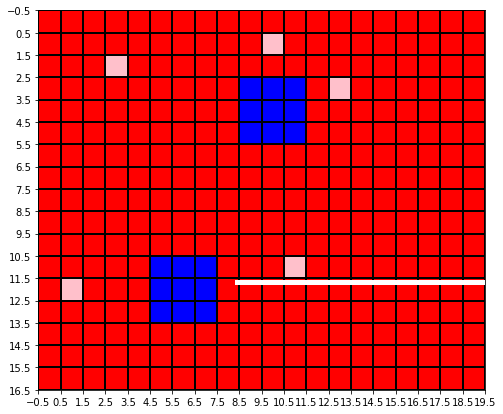

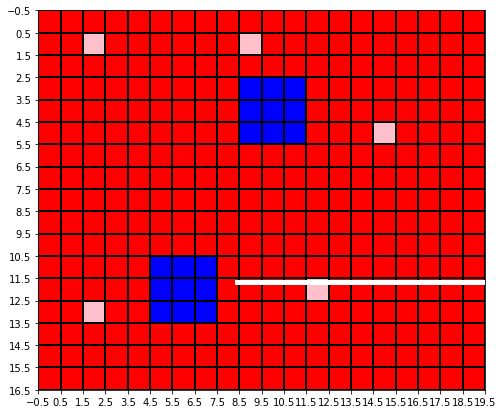

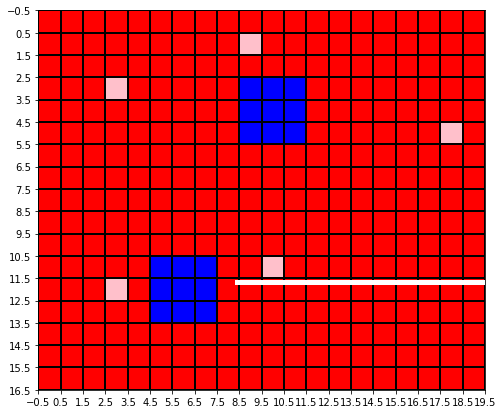

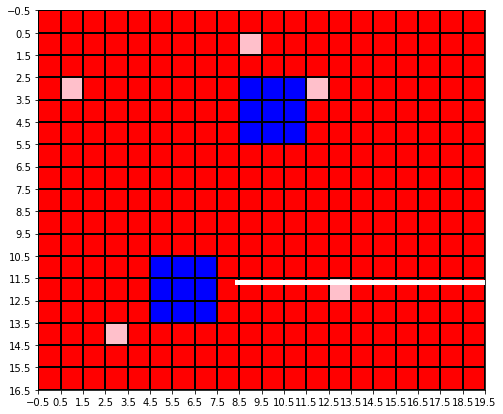

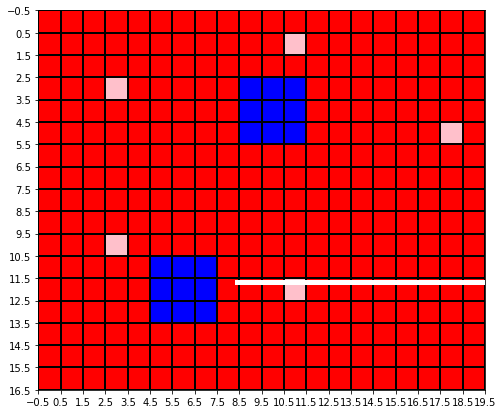

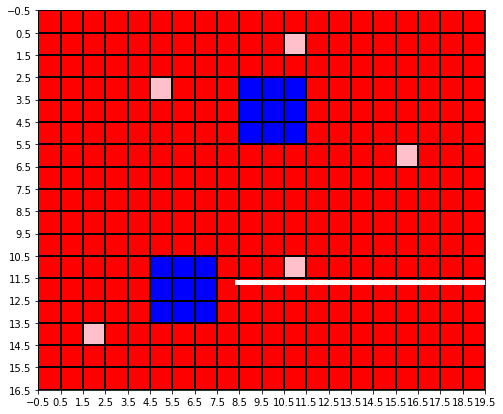

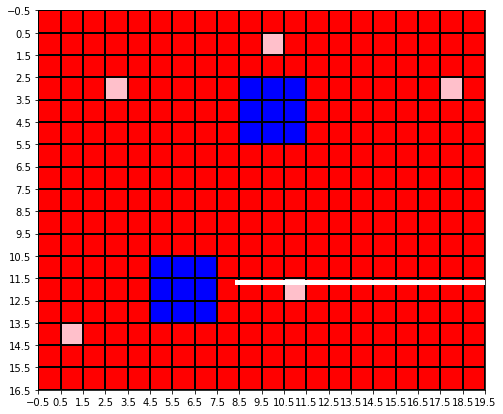

/usr/local/lib/python3.7/dist-packages/gym/spaces/box.py:74: UserWarning: WARN: Box bound precision lowered by casting to float32
  "Box bound precision lowered by casting to {}".format(self.dtype)


----------
partite vinte: 65747
partite con troppe mosse: 6826
area max ultime 100 partite: 21.199999999999957
----------


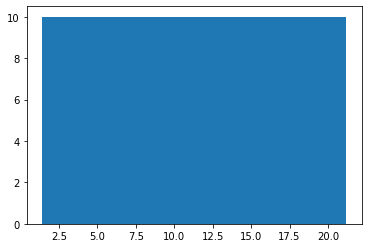

----------
partite vinte: 65752
partite con troppe mosse: 6826
area max ultime 100 partite: 22.199999999999953
----------


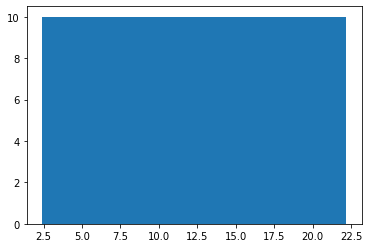

olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0]
olle [2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 1]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 1, 1]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

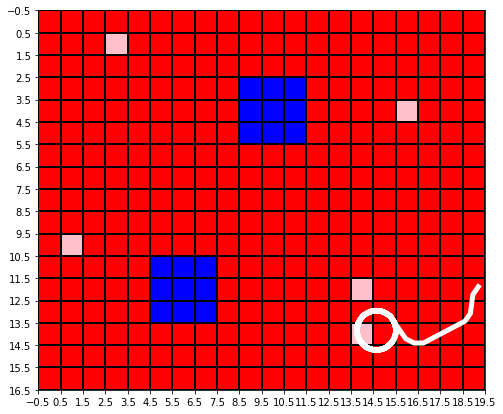

In [ ]:
def evaluate(model, num_episodes=10):
    """
    Evaluate a RL agent
    :param model: (BaseRLModel object) the RL Agent
    :param num_episodes: (int) number of episodes to evaluate it
    :return: (float) Mean reward for the last num_episodes
    """
    # This function will only work for a single Environment
    env=PiazzaDelPopolo()
    kkk=199
    current_reward=0
    past_reward=0
    mappa_passata=np.zeros((size_x,size_y,num_episodes))
    lista_stati_=np.zeros((2,kkk,num_episodes))
    rew=[]
    for i in range(num_episodes):
        current_reward=0
        done = False
        obs = env.reset()
        
        mappa_passata[:,:,i]=env.reward_grid
        reward=0
        for j in range(kkk):
            #if done==True:
            #  break
            # _states are only useful when using LSTM policies
            action, _states = model.predict(obs,deterministic=True)
            # here, action, rewards and dones are arrays
            # because we are using vectorized env
            obs, reward, done, info = env.step(action)
            lista_stati_[:,j,i]=obs[0:2]
            reward+=reward
        rew.append(reward)
    print(rew)
    indexx=rew.index(max(rew))
    cmap = colors.ListedColormap(['blue', 'red','green','pink'])
    bounds = [-2,-0.1,0.1,0.3,0.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)

    lungo=1

    fig, ax = plt.subplots(figsize=(8, 8))
    #print(mappa_passata)
    ax.imshow(mappa_passata[:,:,indexx], cmap=cmap,norm=norm)
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-0.5, 20, 1));

    ax.set_yticks(np.arange(-0.5, 17, 1)); 
    plt.plot(lista_stati_[1,1:,indexx]*size_y,lista_stati_[0,1:,indexx]*size_x,linewidth=5,color='white')


evaluate(model, num_episodes=100)

------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:291: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


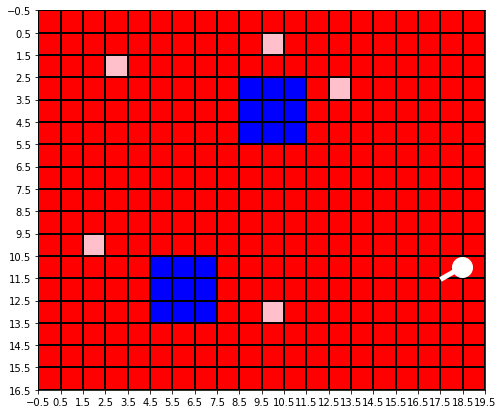

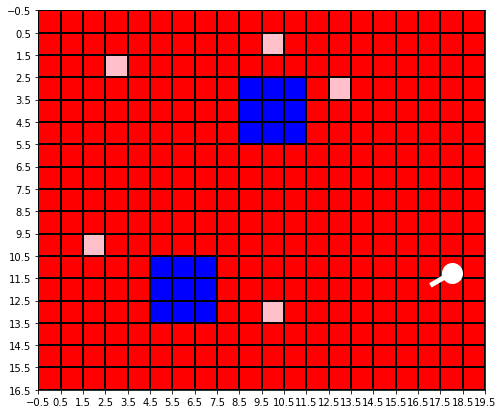

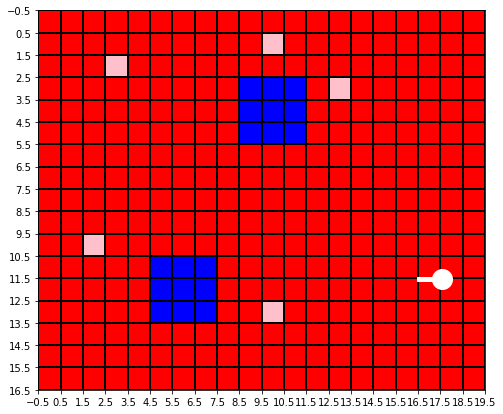

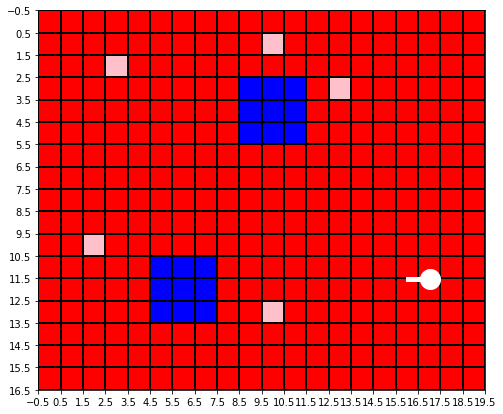

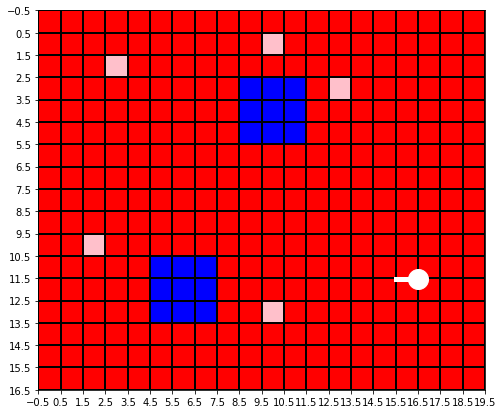

...

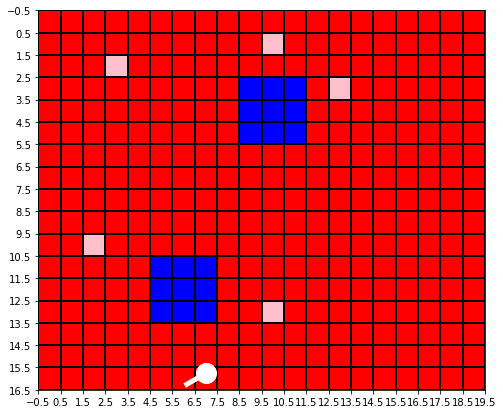

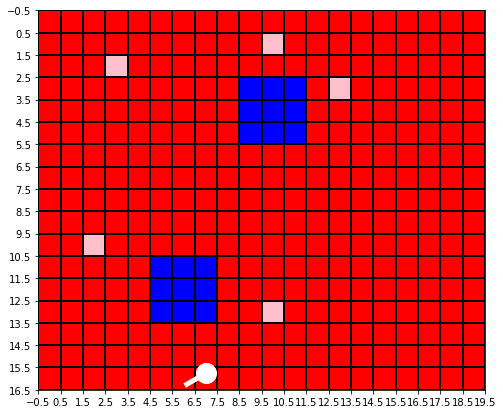

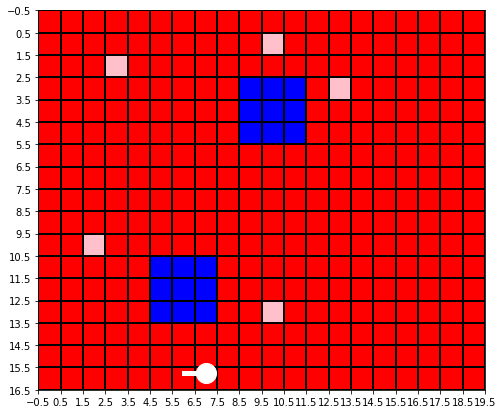

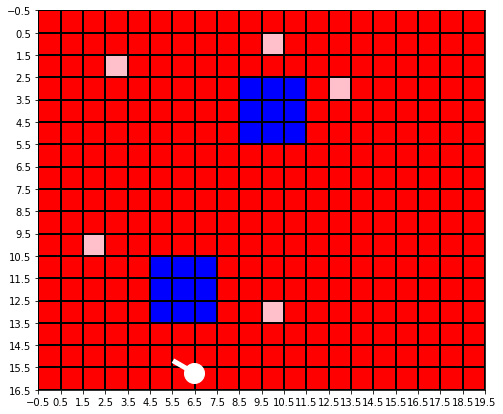

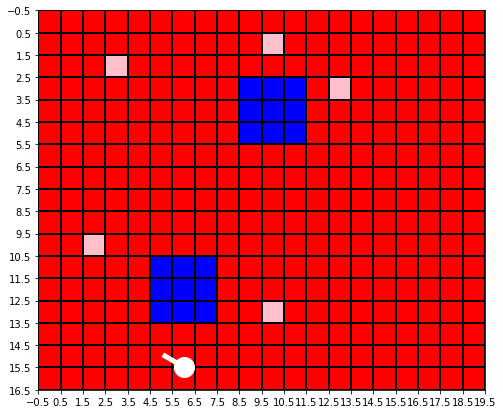

In [ ]:
episodes = 1
for episode in range(1, episodes+1):
    obs = env.reset()
    print('------------')
    done = False

    for i in range(100):
        if done==True:
            break
        action, _states = model.predict(obs)
        obs, reward, dones, info = env.step(action)
        plottagrid(env.reward_grid.reshape(size_x,size_y))

In [ ]:
import warnings
from typing import Any, Callable, Dict, List, Optional, Tuple, Union

import gym
import numpy as np

from stable_baselines3.common import base_class
from stable_baselines3.common.vec_env import DummyVecEnv, VecEnv, VecMonitor, is_vecenv_wrapped




def evaluate_policy(
    model: "base_class.BaseAlgorithm",
    env: Union[gym.Env, VecEnv],
    n_eval_episodes: int = 10,
    deterministic: bool = True,
    render: bool = False,
    callback: Optional[Callable[[Dict[str, Any], Dict[str, Any]], None]] = None,
    reward_threshold: Optional[float] = None,
    return_episode_rewards: bool = False,
    warn: bool = True,
) -> Union[Tuple[float, float], Tuple[List[float], List[int]]]:
    """
    Runs policy for ``n_eval_episodes`` episodes and returns average reward.
    If a vector env is passed in, this divides the episodes to evaluate onto the
    different elements of the vector env. This static division of work is done to
    remove bias. See https://github.com/DLR-RM/stable-baselines3/issues/402 for more
    details and discussion.

    .. note::
        If environment has not been wrapped with ``Monitor`` wrapper, reward and
        episode lengths are counted as it appears with ``env.step`` calls. If
        the environment contains wrappers that modify rewards or episode lengths
        (e.g. reward scaling, early episode reset), these will affect the evaluation
        results as well. You can avoid this by wrapping environment with ``Monitor``
        wrapper before anything else.

    :param model: The RL agent you want to evaluate.
    :param env: The gym environment or ``VecEnv`` environment.
    :param n_eval_episodes: Number of episode to evaluate the agent
    :param deterministic: Whether to use deterministic or stochastic actions
    :param render: Whether to render the environment or not
    :param callback: callback function to do additional checks,
        called after each step. Gets locals() and globals() passed as parameters.
    :param reward_threshold: Minimum expected reward per episode,
        this will raise an error if the performance is not met
    :param return_episode_rewards: If True, a list of rewards and episode lengths
        per episode will be returned instead of the mean.
    :param warn: If True (default), warns user about lack of a Monitor wrapper in the
        evaluation environment.
    :return: Mean reward per episode, std of reward per episode.
        Returns ([float], [int]) when ``return_episode_rewards`` is True, first
        list containing per-episode rewards and second containing per-episode lengths
        (in number of steps).
    """
    is_monitor_wrapped = False
    # Avoid circular import
    from stable_baselines3.common.monitor import Monitor

    if not isinstance(env, VecEnv):
        env = DummyVecEnv([lambda: env])

    is_monitor_wrapped = is_vecenv_wrapped(env, VecMonitor) or env.env_is_wrapped(Monitor)[0]

    if not is_monitor_wrapped and warn:
        warnings.warn(
            "Evaluation environment is not wrapped with a ``Monitor`` wrapper. "
            "This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. "
            "Consider wrapping environment first with ``Monitor`` wrapper.",
            UserWarning,
        )

    n_envs = env.num_envs
    episode_rewards = []
    episode_lengths = []

    episode_counts = np.zeros(n_envs, dtype="int")
    # Divides episodes among different sub environments in the vector as evenly as possible
    episode_count_targets = np.array([(n_eval_episodes + i) // n_envs for i in range(n_envs)], dtype="int")

    current_rewards = np.zeros(n_envs)
    current_lengths = np.zeros(n_envs, dtype="int")
    observations = env.reset()
    states = None
    episode_starts = np.ones((env.num_envs,), dtype=bool)
    while (episode_counts < episode_count_targets).any():
        actions, states = model.predict(observations, state=states, episode_start=episode_starts, deterministic=deterministic)
        observations, rewards, dones, infos = env.step(actions)
        current_rewards += rewards
        current_lengths += 1
        for i in range(n_envs):
            if episode_counts[i] < episode_count_targets[i]:

                # unpack values so that the callback can access the local variables
                reward = rewards[i]
                done = dones[i]
                info = infos[i]
                episode_starts[i] = done

                if callback is not None:
                    callback(locals(), globals())

                if dones[i]:
                    if is_monitor_wrapped:
                        # Atari wrapper can send a "done" signal when
                        # the agent loses a life, but it does not correspond
                        # to the true end of episode
                        if "episode" in info.keys():
                            # Do not trust "done" with episode endings.
                            # Monitor wrapper includes "episode" key in info if environment
                            # has been wrapped with it. Use those rewards instead.
                            episode_rewards.append(info["episode"]["r"])
                            episode_lengths.append(info["episode"]["l"])
                            # Only increment at the real end of an episode
                            episode_counts[i] += 1
                    else:
                        episode_rewards.append(current_rewards[i])
                        episode_lengths.append(current_lengths[i])
                        episode_counts[i] += 1
                    current_rewards[i] = 0
                    current_lengths[i] = 0

        if render:
            env.render()

    mean_reward = np.mean(episode_rewards)
    std_reward = np.std(episode_rewards)
    if reward_threshold is not None:
        assert mean_reward > reward_threshold, "Mean reward below threshold: " f"{mean_reward:.2f} < {reward_threshold:.2f}"
    if return_episode_rewards:
        return episode_rewards, episode_lengths
    return mean_reward, std_reward


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.


mean_reward:11.06 +/- 2.95


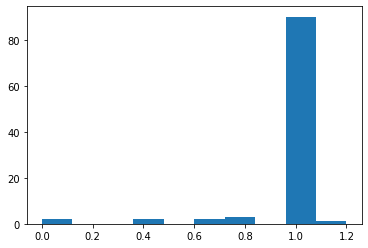

In [ ]:
# Use a separate environement for evaluation
eval_env=PiazzaDelPopolo()

# Random Agent, before training
mean_reward, std_reward = evaluate_policy(model, eval_env, n_eval_episodes=100)

print(f"mean_reward:{mean_reward:.2f} +/- {std_reward:.2f}")
plt.hist(lista_aree[len(lista_aree)-100:])
plt.show()